In [1]:
import sys
sys.path.append("../")

import math
import torch
import numpy as np
from models.LASE_unshared_normalized import LASE
from models.bigbird_attention import big_bird_attention
from torch_geometric.utils import to_dense_adj, stochastic_blockmodel_graph, erdos_renyi_graph
import matplotlib.pyplot as plt
import seaborn as sns
from networkx import watts_strogatz_graph
from torch_geometric.utils.convert import from_networkx
from training.get_init import get_x_init

def ground_truth_adjacency_matrix(n,p):
    for row_id, row in enumerate(np.array(p)):
        for item_id, item in enumerate(row):
            if item_id == 0:
                A_row = np.ones([n[row_id],n[item_id]])*item
            else:
                A_row = np.hstack((A_row,np.ones([n[row_id],n[item_id]])*item))
                
        if row_id == 0:
            A = A_row
        else:
            A = np.vstack((A,A_row))
    return A

# SBM-3

In [2]:
torch.manual_seed(42)
d = 3
gd_steps = 5
device = 'cpu'

num_nodes = 2400
n = [1200, 800, 400]

p = [
     [0.9, 0.2, 0.1],
     [0.2, 0.6, 0.2],
     [0.1, 0.2, 0.7]
]

x  = torch.rand((num_nodes, d)).to(device)
edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)
ER05 = erdos_renyi_graph(num_nodes, 0.5, directed=False).to(device)
ER03 = erdos_renyi_graph(num_nodes, 0.3, directed=False).to(device)
ER01 = erdos_renyi_graph(num_nodes, 0.1, directed=False).to(device)
WS_0501 = from_networkx(watts_strogatz_graph(num_nodes, 1200, 0.1, seed=None)).edge_index.to(device)
WS_0301 = from_networkx(watts_strogatz_graph(num_nodes, 720, 0.1, seed=None)).edge_index.to(device)
WS_0101 = from_networkx(watts_strogatz_graph(num_nodes, 240, 0.1, seed=None)).edge_index.to(device)
BB_01_005 = big_bird_attention(60, 0.05, num_nodes).to(device)
BB_03_01 = big_bird_attention(300, 0.1, num_nodes).to(device)
BB_05_01 = big_bird_attention(700, 0.05, num_nodes).to(device)

## GROUND TRUTH
A = ground_truth_adjacency_matrix(n,p)

Loss LASE shared weights (5 layers - Sparse Attention ER05:  tensor(912.9926)
Loss LASE shared weights (5 layers - Sparse Attention ER03:  tensor(945.6340)
Loss LASE shared weights (5 layers - Sparse Attention ER01:  tensor(984.4609)


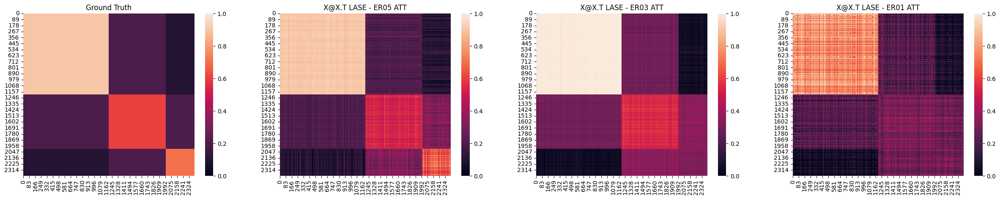

In [3]:
lase_ER05 = LASE(d, d, gd_steps)
lase_ER05.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_ER05.pt'))
lase_ER05.to(device)
lase_ER05.eval()

lase_ER03 = LASE(d, d, gd_steps)
lase_ER03.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_ER03.pt'))
lase_ER03.to(device)
lase_ER03.eval()

lase_ER01 = LASE(d, d, gd_steps)
lase_ER01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_ER01.pt'))
lase_ER01.to(device)
lase_ER01.eval()


## ER
x_lase_ER05 = lase_ER05(x, edge_index, ER05, mask)
x_lase_ER05 = x_lase_ER05.detach()
loss = torch.norm((x_lase_ER05@x_lase_ER05.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER05: ", loss)
x_lase_ER05 = x_lase_ER05.to('cpu')

x_lase_ER03 = lase_ER03(x, edge_index, ER03, mask)
x_lase_ER03 = x_lase_ER03.detach()
loss = torch.norm((x_lase_ER03@x_lase_ER03.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER03: ", loss)
x_lase_ER03 = x_lase_ER03.to('cpu')

x_lase_ER01 = lase_ER01(x, edge_index, ER01, mask)
x_lase_ER01 = x_lase_ER01.detach()
loss = torch.norm((x_lase_ER01@x_lase_ER01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER01: ", loss)
x_lase_ER01 = x_lase_ER01.to('cpu')

fig, axes = plt.subplots(1, 4, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - ER05 ATT')
sns.heatmap(x_lase_ER05@x_lase_ER05.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - ER03 ATT')
sns.heatmap(x_lase_ER03@x_lase_ER03.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - ER01 ATT')
sns.heatmap(x_lase_ER01@x_lase_ER01.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
plt.show()


Loss LASE shared weights (5 layers - Sparse Attention WS degree=05 randomness=01:  tensor(920.1736)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=03 randomness=01:  tensor(932.3289)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=01 randomness=01:  tensor(930.7302)


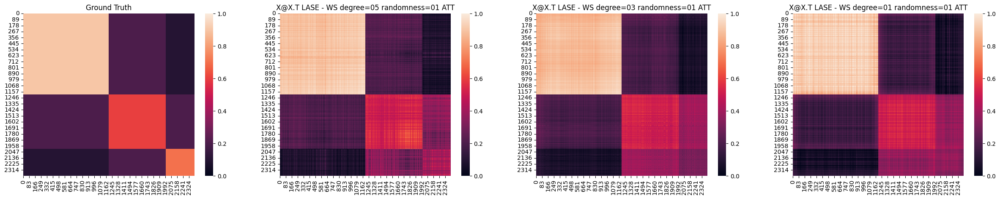

In [5]:
lase_WS_05_01 = LASE(d, d, gd_steps)
lase_WS_05_01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_WS05.pt'))
lase_WS_05_01.to(device)
lase_WS_05_01.eval()

lase_WS_03_01 = LASE(d, d, gd_steps)
lase_WS_03_01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_WS03.pt'))
lase_WS_03_01.to(device)
lase_WS_03_01.eval()

lase_WS_01_01 = LASE(d, d, gd_steps)
lase_WS_01_01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_WS01.pt'))
lase_WS_01_01.to(device)
lase_WS_01_01.eval()


x_lase_WS_05_01 = lase_WS_05_01(x, edge_index, WS_0501, mask)
x_lase_WS_05_01 = x_lase_WS_05_01.detach()
loss = torch.norm((x_lase_WS_05_01@x_lase_WS_05_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=05 randomness=01: ", loss)
x_lase_WS_05_01 = x_lase_WS_05_01.to('cpu')

x_lase_WS_03_01 = lase_WS_03_01(x, edge_index, WS_0301, mask)
x_lase_WS_03_01 = x_lase_WS_03_01.detach()
loss = torch.norm((x_lase_WS_03_01@x_lase_WS_03_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=03 randomness=01: ", loss)
x_lase_WS_03_01 = x_lase_WS_03_01.to('cpu')

x_lase_WS_01_01 = lase_WS_01_01(x, edge_index, WS_0101, mask)
x_lase_WS_01_01 = x_lase_WS_01_01.detach()
loss = torch.norm((x_lase_WS_01_01@x_lase_WS_01_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=01 randomness=01: ", loss)
x_lase_WS_01_01 = x_lase_WS_01_01.to('cpu')


fig, axes = plt.subplots(1, 4, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - WS degree=05 randomness=01 ATT')
sns.heatmap(x_lase_WS_05_01@x_lase_WS_05_01.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - WS degree=03 randomness=01 ATT')
sns.heatmap(x_lase_WS_03_01@x_lase_WS_03_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - WS degree=01 randomness=01 ATT')
sns.heatmap(x_lase_WS_01_01@x_lase_WS_01_01.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
plt.show()


Loss LASE shared weights (5 layers - Sparse Attention BB degree=05 randomness=005:  tensor(947.9985)
Loss LASE shared weights (5 layers - Sparse Attention BB degree=03 randomness=01:  tensor(930.4728)
Loss LASE shared weights (5 layers - Sparse Attention BB degree=01 randomness=005:  tensor(948.9763)


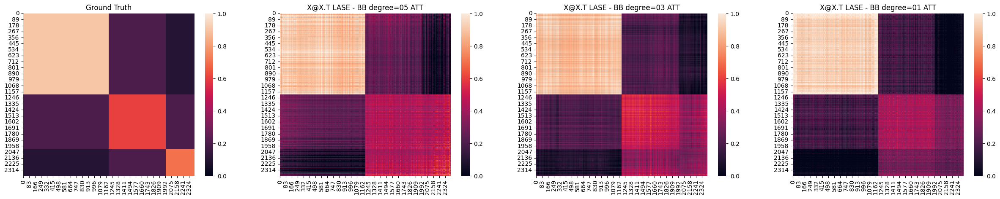

In [32]:
lase_BB_05_01 = LASE(d, d, gd_steps)
lase_BB_05_01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_BB05.pt'))
lase_BB_05_01.to(device)
lase_BB_05_01.eval()

lase_BB_03_01 = LASE(d, d, gd_steps)
lase_BB_03_01.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_BB03.pt'))
lase_BB_03_01.to(device)
lase_BB_03_01.eval()

lase_BB_01_005 = LASE(d, d, gd_steps)
lase_BB_01_005.load_state_dict(torch.load('../saved_models/lase_unshared_d3_normalized_unbalanced_rand_v2_BB01.pt'))
lase_BB_01_005.to(device)
lase_BB_01_005.eval()


## BB
x_lase_BB_05_01 = lase_BB_05_01(x, edge_index, BB_05_01, mask)
x_lase_BB_05_01 = x_lase_BB_05_01.detach()
loss = torch.norm((x_lase_BB_05_01@x_lase_BB_05_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=05 randomness=005: ", loss)
x_lase_BB_05_01 = x_lase_BB_05_01.to('cpu')

x_lase_BB_03_01 = lase_BB_03_01(x, edge_index, BB_03_01, mask)
x_lase_BB_03_01 = x_lase_BB_03_01.detach()
loss = torch.norm((x_lase_BB_03_01@x_lase_BB_03_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=03 randomness=01: ", loss)
x_lase_BB_03_01 = x_lase_BB_03_01.to('cpu')

x_lase_BB_01_005 = lase_BB_01_005(x, edge_index, BB_01_005, mask)
x_lase_BB_01_005 = x_lase_BB_01_005.detach()
loss = torch.norm((x_lase_BB_01_005@x_lase_BB_01_005.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=01 randomness=005: ", loss)
x_lase_BB_01_005 = x_lase_BB_01_005.to('cpu')


fig, axes = plt.subplots(1, 4, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - BB degree=05 ATT')
sns.heatmap(x_lase_BB_05_01@x_lase_BB_05_01.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - BB degree=03 ATT')
sns.heatmap(x_lase_BB_03_01@x_lase_BB_03_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - BB degree=01 ATT')
sns.heatmap(x_lase_BB_01_005@x_lase_BB_01_005.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

# SBM-5

In [6]:
d = 5
gd_steps = 5
device = 'cpu'

lase_full = GD_Unroll_w_norm(d, d, gd_steps)
lase_full.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced.pt'))
lase_full.to(device)
lase_full.eval()

lase_ER05 = GD_Unroll_w_norm(d, d, gd_steps)
lase_ER05.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_ER05.pt'))
lase_ER05.to(device)
lase_ER05.eval()

lase_ER03 = GD_Unroll_w_norm(d, d, gd_steps)
lase_ER03.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_ER03.pt'))
lase_ER03.to(device)
lase_ER03.eval()

lase_ER01 = GD_Unroll_w_norm(d, d, gd_steps)
lase_ER01.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_ER01.pt'))
lase_ER01.to(device)
lase_ER01.eval()

lase_WS_05_01 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_05_01.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_175_01.pt'))
lase_WS_05_01.to(device)
lase_WS_05_01.eval()

lase_WS_05_05 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_05_05.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_175_05.pt'))
lase_WS_05_05.to(device)
lase_WS_05_05.eval()

lase_WS_05_09 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_05_09.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_175_09.pt'))
lase_WS_05_09.to(device)
lase_WS_05_09.eval()

lase_WS_03_01 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_03_01.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_100_01.pt'))
lase_WS_03_01.to(device)
lase_WS_03_01.eval()

lase_WS_03_05 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_03_05.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_100_05.pt'))
lase_WS_03_05.to(device)
lase_WS_03_05.eval()

lase_WS_03_09 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_03_09.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_100_09.pt'))
lase_WS_03_09.to(device)
lase_WS_03_09.eval()

lase_WS_01_01 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_01_01.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_35_01.pt'))
lase_WS_01_01.to(device)
lase_WS_01_01.eval()

lase_WS_01_05 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_01_05.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_35_05.pt'))
lase_WS_01_05.to(device)
lase_WS_01_05.eval()

lase_WS_01_09 = GD_Unroll_w_norm(d, d, gd_steps)
lase_WS_01_09.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_WS_35_09.pt'))
lase_WS_01_09.to(device)
lase_WS_01_09.eval()

lase_BB_01_002= GD_Unroll_w_norm(d, d, gd_steps)
lase_BB_01_002.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_BB_01_002.pt'))
lase_BB_01_002.to(device)
lase_BB_01_002.eval()

lase_BB_01_005 = GD_Unroll_w_norm(d, d, gd_steps)
lase_BB_01_005.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_BB_01_005.pt'))
lase_BB_01_005.to(device)
lase_BB_01_005.eval()

lase_BB_01_008 = GD_Unroll_w_norm(d, d, gd_steps)
lase_BB_01_008.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_BB_01_008.pt'))
lase_BB_01_008.to(device)
lase_BB_01_008.eval()



lase_BB_05_01 = GD_Unroll_w_norm(d, d, gd_steps)
lase_BB_05_01.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_BB_05_01.pt'))
lase_BB_05_01.to(device)
lase_BB_05_01.eval()


lase_BB_03_005 = GD_Unroll_w_norm(d, d, gd_steps)
lase_BB_03_005.load_state_dict(torch.load('../../saved_models/paper/lase_unshared_d5_normalized_unbalanced_BB_03_005.pt'))
lase_BB_03_005.to(device)
lase_BB_03_005.eval()

GD_Unroll(
  (gd): Sequential(
    (0): GD_Block(
    (gcn): TAGConv(5, 5, K=1)
    (gat): Transformer_Block(
      (lin2): Linear(in_features=5, out_features=5, bias=False)
      (lin3): Linear(in_features=5, out_features=5, bias=False)
      (lin4): Linear(in_features=5, out_features=5, bias=False)
    )
  )
    (1): GD_Block(
    (gcn): TAGConv(5, 5, K=1)
    (gat): Transformer_Block(
      (lin2): Linear(in_features=5, out_features=5, bias=False)
      (lin3): Linear(in_features=5, out_features=5, bias=False)
      (lin4): Linear(in_features=5, out_features=5, bias=False)
    )
  )
    (2): GD_Block(
    (gcn): TAGConv(5, 5, K=1)
    (gat): Transformer_Block(
      (lin2): Linear(in_features=5, out_features=5, bias=False)
      (lin3): Linear(in_features=5, out_features=5, bias=False)
      (lin4): Linear(in_features=5, out_features=5, bias=False)
    )
  )
    (3): GD_Block(
    (gcn): TAGConv(5, 5, K=1)
    (gat): Transformer_Block(
      (lin2): Linear(in_features=5, out_feature

In [7]:
num_nodes = 1750
n = [500, 250, 450, 300, 250]
p = [
    [0.9, 0.1, 0.2, 0.2, 0.1],
    [0.1, 0.8, 0.1, 0.1, 0.2],
    [0.2, 0.1, 0.7, 0.2, 0.1],
    [0.2, 0.1, 0.2, 0.8, 0.2],
    [0.1, 0.2, 0.1, 0.2, 0.9],
]

x  = get_x_init(num_nodes, d, 0, math.pi/2, 0, math.pi/2).to(device)
edge_index = stochastic_blockmodel_graph(n, p).to(device)
edge_index_2 = torch.ones([num_nodes,num_nodes],).nonzero().t().contiguous().to(device)
mask = (torch.ones([num_nodes,num_nodes],)-torch.eye(num_nodes)).nonzero().t().contiguous().to(device)
ER05 = erdos_renyi_graph(num_nodes, 0.5, directed=False).to(device)
ER03 = erdos_renyi_graph(num_nodes, 0.3, directed=False).to(device)
ER01 = erdos_renyi_graph(num_nodes, 0.1, directed=False).to(device)

WS_0501 = from_networkx(watts_strogatz_graph(num_nodes, 875, 0.1, seed=None)).edge_index.to(device)
WS_0505 = from_networkx(watts_strogatz_graph(num_nodes, 875, 0.5, seed=None)).edge_index.to(device)
WS_0509 = from_networkx(watts_strogatz_graph(num_nodes, 875, 0.9, seed=None)).edge_index.to(device)

WS_0301 = from_networkx(watts_strogatz_graph(num_nodes, 525, 0.1, seed=None)).edge_index.to(device)
WS_0305 = from_networkx(watts_strogatz_graph(num_nodes, 525, 0.5, seed=None)).edge_index.to(device)
WS_0309 = from_networkx(watts_strogatz_graph(num_nodes, 525, 0.9, seed=None)).edge_index.to(device)

WS_0101 = from_networkx(watts_strogatz_graph(num_nodes, 175, 0.1, seed=None)).edge_index.to(device)
WS_0105 = from_networkx(watts_strogatz_graph(num_nodes, 175, 0.5, seed=None)).edge_index.to(device)
WS_0109 = from_networkx(watts_strogatz_graph(num_nodes, 175, 0.9, seed=None)).edge_index.to(device)

BB_01_002 = big_bird_attention(75, 0.02, num_nodes).to(device)
BB_01_005 = big_bird_attention(50, 0.05, num_nodes).to(device)
BB_01_008 = big_bird_attention(25, 0.08, num_nodes).to(device)
BB_05_01 = big_bird_attention(450, 0.1, num_nodes).to(device)
BB_03_005 = big_bird_attention(250, 0.05, num_nodes).to(device)


## GROUND TRUTH
A = ground_truth_adjacency_matrix(n,p)

x_lase_full = lase_full(x, edge_index, edge_index_2, mask)
x_lase_full = x_lase_full.detach()
loss = torch.norm((x_lase_full@x_lase_full.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers) - Full Attention: ", loss)
x_lase_full = x_lase_full.to('cpu')

## ER

x_lase_ER05 = lase_ER05(x, edge_index, ER05, mask)
x_lase_ER05 = x_lase_ER05.detach()
loss = torch.norm((x_lase_ER05@x_lase_ER05.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER05: ", loss)
x_lase_ER05 = x_lase_ER05.to('cpu')

x_lase_ER03 = lase_ER03(x, edge_index, ER03, mask)
x_lase_ER03 = x_lase_ER03.detach()
loss = torch.norm((x_lase_ER03@x_lase_ER03.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER03: ", loss)
x_lase_ER03 = x_lase_ER03.to('cpu')

x_lase_ER01 = lase_ER01(x, edge_index, ER01, mask)
x_lase_ER01 = x_lase_ER01.detach()
loss = torch.norm((x_lase_ER01@x_lase_ER01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention ER01: ", loss)
x_lase_ER01 = x_lase_ER01.to('cpu')

## WS 

x_lase_WS_05_01 = lase_WS_05_01(x, edge_index, WS_0501, mask)
x_lase_WS_05_01 = x_lase_WS_05_01.detach()
loss = torch.norm((x_lase_WS_05_01@x_lase_WS_05_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=05 randomness=01: ", loss)
x_lase_WS_05_01 = x_lase_WS_05_01.to('cpu')

x_lase_WS_05_05 = lase_WS_05_05(x, edge_index, WS_0505, mask)
x_lase_WS_05_05 = x_lase_WS_05_05.detach()
loss = torch.norm((x_lase_WS_05_05@x_lase_WS_05_05.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=05 randomness=05: ", loss)
x_lase_WS_05_05 = x_lase_WS_05_05.to('cpu')

x_lase_WS_05_09 = lase_WS_05_09(x, edge_index, WS_0509, mask)
x_lase_WS_05_09 = x_lase_WS_05_09.detach()
loss = torch.norm((x_lase_WS_05_09@x_lase_WS_05_09.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=05 randomness=09: ", loss)
x_lase_WS_05_09 = x_lase_WS_05_09.to('cpu')

x_lase_WS_03_01 = lase_WS_03_01(x, edge_index, WS_0301, mask)
x_lase_WS_03_01 = x_lase_WS_03_01.detach()
loss = torch.norm((x_lase_WS_03_01@x_lase_WS_03_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS egree=03 randomness=01: ", loss)
x_lase_WS_03_01 = x_lase_WS_03_01.to('cpu')

x_lase_WS_03_05 = lase_WS_03_05(x, edge_index, WS_0305, mask)
x_lase_WS_03_05 = x_lase_WS_03_05.detach()
loss = torch.norm((x_lase_WS_03_05@x_lase_WS_03_05.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=03 randomness=05: ", loss)
x_lase_WS_03_05 = x_lase_WS_03_05.to('cpu')

x_lase_WS_03_09 = lase_WS_03_09(x, edge_index, WS_0309, mask)
x_lase_WS_03_09 = x_lase_WS_03_09.detach()
loss = torch.norm((x_lase_WS_03_09@x_lase_WS_03_09.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=03 randomness=09: ", loss)
x_lase_WS_03_09 = x_lase_WS_03_09.to('cpu')

x_lase_WS_01_01 = lase_WS_01_01(x, edge_index, WS_0101, mask)
x_lase_WS_01_01 = x_lase_WS_01_01.detach()
loss = torch.norm((x_lase_WS_01_01@x_lase_WS_01_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=01 randomness=01: ", loss)
x_lase_WS_01_01 = x_lase_WS_01_01.to('cpu')

x_lase_WS_01_05 = lase_WS_01_05(x, edge_index, WS_0105, mask)
x_lase_WS_01_05 = x_lase_WS_01_05.detach()
loss = torch.norm((x_lase_WS_01_05@x_lase_WS_01_05.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=01 randomness=05: ", loss)
x_lase_WS_01_05 = x_lase_WS_01_05.to('cpu')

x_lase_WS_01_09 = lase_WS_01_09(x, edge_index, WS_0109, mask)
x_lase_WS_01_09 = x_lase_WS_01_09.detach()
loss = torch.norm((x_lase_WS_01_09@x_lase_WS_01_09.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention WS degree=01 randomness=09: ", loss)
x_lase_WS_01_09 = x_lase_WS_01_09.to('cpu')


## BB
x_lase_BB_01_002 = lase_BB_01_002(x, edge_index, BB_01_002, mask)
x_lase_BB_01_002 = x_lase_BB_01_002.detach()
loss = torch.norm((x_lase_BB_01_002@x_lase_BB_01_002.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=01 randomness=002: ", loss)
x_lase_BB_01_002 = x_lase_BB_01_002.to('cpu')

x_lase_BB_01_005 = lase_BB_01_005(x, edge_index, BB_01_005, mask)
x_lase_BB_01_005 = x_lase_BB_01_005.detach()
loss = torch.norm((x_lase_BB_01_005@x_lase_BB_01_005.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=01 randomness=005: ", loss)
x_lase_BB_01_005 = x_lase_BB_01_005.to('cpu')

x_lase_BB_01_008 = lase_BB_01_008(x, edge_index, BB_01_008, mask)
x_lase_BB_01_008 = x_lase_BB_01_008.detach()
loss = torch.norm((x_lase_BB_01_008@x_lase_BB_01_008.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=01 randomness=008: ", loss)
x_lase_BB_01_005 = x_lase_BB_01_008.to('cpu')


x_lase_BB_05_01 = lase_BB_05_01(x, edge_index, BB_05_01, mask)
x_lase_BB_05_01 = x_lase_BB_05_01.detach()
loss = torch.norm((x_lase_BB_05_01@x_lase_BB_05_01.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=05 randomness=01: ", loss)
x_lase_BB_05_01 = x_lase_BB_05_01.to('cpu')

x_lase_BB_03_005 = lase_BB_03_005(x, edge_index, BB_03_005, mask)
x_lase_BB_03_005 = x_lase_BB_03_005.detach()
loss = torch.norm((x_lase_BB_03_005@x_lase_BB_03_005.T - to_dense_adj(edge_index).squeeze(0))*to_dense_adj(mask).squeeze(0))
print(f"Loss LASE shared weights ({gd_steps} layers - Sparse Attention BB degree=03 randomness=005: ", loss)
x_lase_BB_03_005 = x_lase_BB_03_005.to('cpu')


Loss LASE shared weights (5 layers) - Full Attention:  tensor(631.3731)
Loss LASE shared weights (5 layers - Sparse Attention ER05:  tensor(632.5436)
Loss LASE shared weights (5 layers - Sparse Attention ER03:  tensor(639.8380)
Loss LASE shared weights (5 layers - Sparse Attention ER01:  tensor(659.2125)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=05 randomness=01:  tensor(631.8002)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=05 randomness=05:  tensor(632.0394)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=05 randomness=09:  tensor(633.0739)
Loss LASE shared weights (5 layers - Sparse Attention WS egree=03 randomness=01:  tensor(631.7628)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=03 randomness=05:  tensor(632.4735)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=03 randomness=09:  tensor(634.6484)
Loss LASE shared weights (5 layers - Sparse Attention WS degree=01 randomness=01:  tensor(632.1

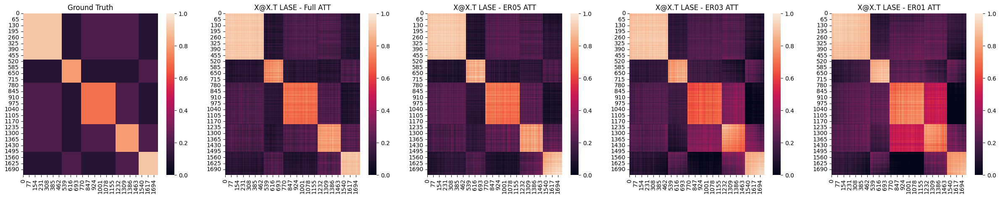

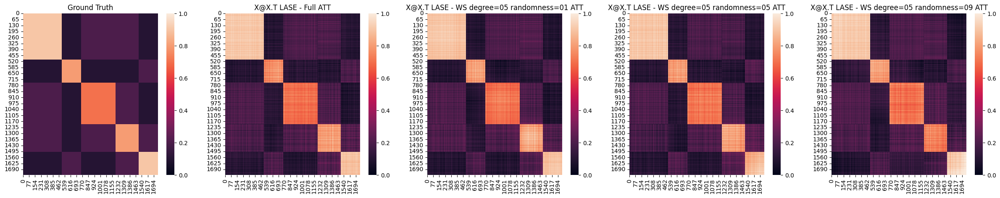

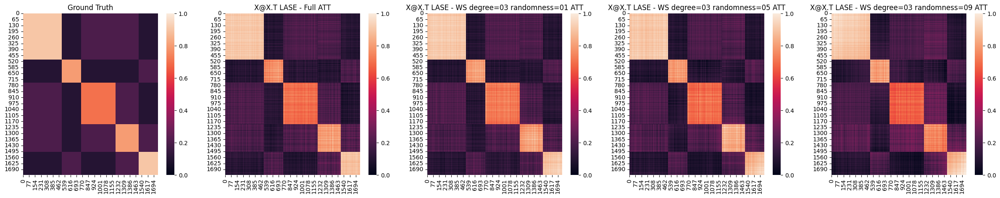

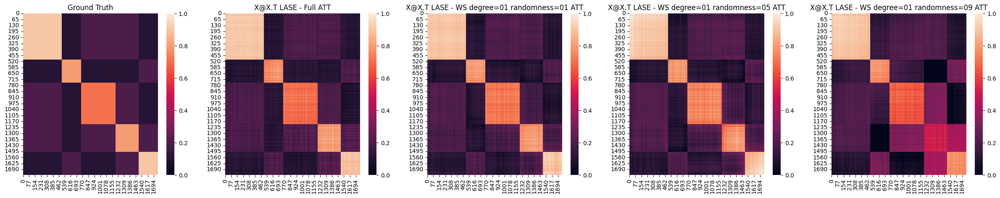

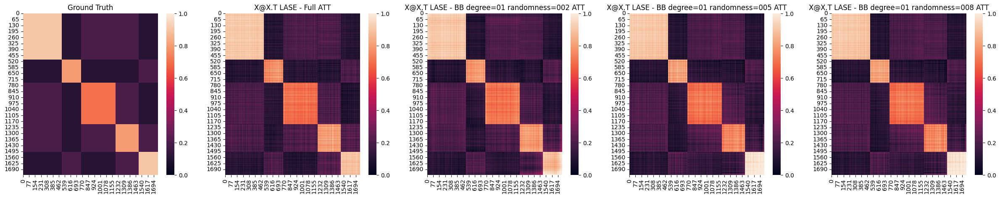

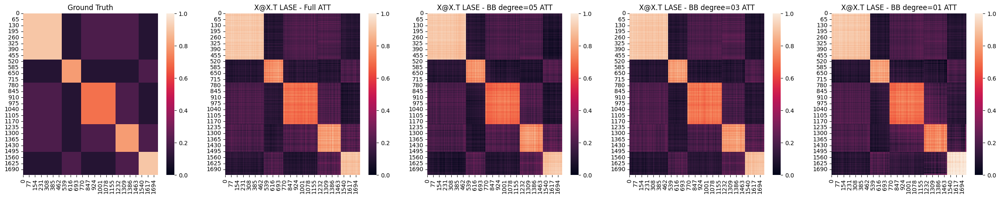

In [9]:
fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - ER05 ATT')
sns.heatmap(x_lase_ER05@x_lase_ER05.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - ER03 ATT')
sns.heatmap(x_lase_ER03@x_lase_ER03.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - ER01 ATT')
sns.heatmap(x_lase_ER01@x_lase_ER01.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()

fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - WS degree=05 randomness=01 ATT')
sns.heatmap(x_lase_WS_05_01@x_lase_WS_05_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - WS degree=05 randomness=05 ATT')
sns.heatmap(x_lase_WS_05_05@x_lase_WS_05_05.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - WS degree=05 randomness=09 ATT')
sns.heatmap(x_lase_WS_05_09@x_lase_WS_05_09.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - WS degree=03 randomness=01 ATT')
sns.heatmap(x_lase_WS_03_01@x_lase_WS_03_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - WS degree=03 randomness=05 ATT')
sns.heatmap(x_lase_WS_03_05@x_lase_WS_03_05.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - WS degree=03 randomness=09 ATT')
sns.heatmap(x_lase_WS_03_09@x_lase_WS_03_09.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - WS degree=01 randomness=01 ATT')
sns.heatmap(x_lase_WS_01_01@x_lase_WS_01_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - WS degree=01 randomness=05 ATT')
sns.heatmap(x_lase_WS_01_05@x_lase_WS_01_05.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - WS degree=01 randomness=09 ATT')
sns.heatmap(x_lase_WS_01_09@x_lase_WS_01_09.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()


fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - BB degree=01 randomness=002 ATT')
sns.heatmap(x_lase_BB_01_002@x_lase_BB_01_002.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - BB degree=01 randomness=005 ATT')
sns.heatmap(x_lase_BB_01_005@x_lase_BB_01_005.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - BB degree=01 randomness=008 ATT')
sns.heatmap(x_lase_BB_01_008@x_lase_BB_01_008.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()



fig, axes = plt.subplots(1, 5, figsize =(30,5))
axes[0].set_title(f'Ground Truth')
sns.heatmap(A, ax=axes[0], vmin=0.0, vmax=1.0, cbar=True)
axes[1].set_title(f'X@X.T LASE - Full ATT')
sns.heatmap(x_lase_full@x_lase_full.T, ax=axes[1], vmin=0.0, vmax=1.0, cbar=True)
axes[2].set_title(f'X@X.T LASE - BB degree=05 ATT')
sns.heatmap(x_lase_BB_05_01@x_lase_BB_05_01.T, ax=axes[2], vmin=0.0, vmax=1.0, cbar=True)
axes[3].set_title(f'X@X.T LASE - BB degree=03 ATT')
sns.heatmap(x_lase_BB_03_005@x_lase_BB_03_005.T, ax=axes[3], vmin=0.0, vmax=1.0, cbar=True)
axes[4].set_title(f'X@X.T LASE - BB degree=01 ATT')
sns.heatmap(x_lase_BB_01_005@x_lase_BB_01_005.T, ax=axes[4], vmin=0.0, vmax=1.0, cbar=True)
plt.show()